# 1.0 Introdução

O dataset utilizado para a analise apresentada é seguir, apresenta dados do sistema de compartilhamento de bicicletas do programa **Capital BikeShare** utilizado em Washigthon DC.





#2.0 Dados Obtidos

## 2.1 Uploading files 

In [192]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving test.csv to test.csv
Saving train.csv to train (1).csv
User uploaded file "test.csv" with length 323856 bytes
User uploaded file "train.csv" with length 648352 bytes


## 2.2 Estrutura dos dados

In [194]:
import pandas as pd

# read the dataset to a Pandas' dataframe
data = pd.read_csv("train.csv")
#data.head(25)
#data.tail()
test = pd.read_csv("test.csv")
test.head()
#data.tail()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed
0,2011-01-20 00:00:00,1,0,1,1,10.66,11.365,56,26.0027
1,2011-01-20 01:00:00,1,0,1,1,10.66,13.635,56,0.0000
2,2011-01-20 02:00:00,1,0,1,1,10.66,13.635,56,0.0000
3,2011-01-20 03:00:00,1,0,1,1,10.66,12.880,56,11.0014
4,2011-01-20 04:00:00,1,0,1,1,10.66,12.880,56,11.0014


Cada coluna representa uma hora de um dia. Há 12 diferentes atributos:
- **datetime**: data e hora (durante 2 anos inteiros)
- **season**: 1 = primavera, 2 = verão, 3 = outono, 4 = inverno 
- **holiday**: feriado
- **workingday**:  dia útil
- **weather**: 1: Claro, Pouco nublado, Pouco nublado, Pouco nublado
2: Névoa + Nublado, Névoa + nuvens quebradas, Névoa + Algumas nuvens, Névoa
3: Nevões fracos, Chuva fraca + Trovoada + Nuvens dispersas, Chuva fraca + Nuvens dispersas
4: Chuva forte + Gelo + Trovoada + Névoa, Neve + Nevoeiro
- **temp**: temperatura in Celsius
- **atemp**: "sensação termica" da temperatura em Celsius
- **humidity**:  humidade relativa
- **windspeed**:  velocidade do vento
- **casual**: número de alugueis sem registro iniciados
- **registered**: número de alugueis com registros iniciados
- **total**: número total de alugueis

Através do método **info()**  é possível observar o número total de linhas, o tipo e a quantidade de valores não nulos de cada atributo. No dataset utilizado, não foram encontrados nem atributo sem valores atribuídos em nenhuma de suas linhas.

In [185]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
datetime      10886 non-null object
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
total         10886 non-null int64
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.6+ KB


- Há 10,886 instancias no dataset

-  Todos os atributos são númericos (int e float), com exceção do campo **datetime**  que é do tipo objeto.

> > Como seus valores não são repetitivos (há um valor para cada linha), não se trata de um atributo categorico.

-Não temos a mesma quantidade de dados para as 4 estações do ano.

In [187]:
# You can find out what categories exist and 
# how many districts belong to each category
# by using the value_counts()

#data.datetime.value_counts()
#data.season.value_counts()
#data.holiday.value_counts()
#data.workingday.value_counts()
#data.registered.value_counts()
#data.windspeed.value_counts()
data.weather.value_counts()


1    7192
2    2834
3     859
4       1
Name: weather, dtype: int64

In [188]:
# The describe() method shows a summary of the numerical attributes
# Note that non numerical features were not shown
data.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


- The **count, mean, min, and max** rows are self-explanatory. 
- Note that the null values are ignored (so, for example, count of total_bedrooms is 20,433, not 20,640). 
- The **std** row shows the standard deviation (which measures how dispersed the values are). 
- The **25%, 50%, and 75%** rows show the corresponding percentiles: a percentile indicates the value below which a given percentage of observations in a group
of observations falls. For example, 25% of the districts have a **housing_median_age** lower than 18, while 50% are lower than 29 and 75% are lower than 37. These are often called the 25th percentile (or 1st quartile), the median,   and the 75th percentile (or 3rd quartile).

### 2.2.1 Histograma



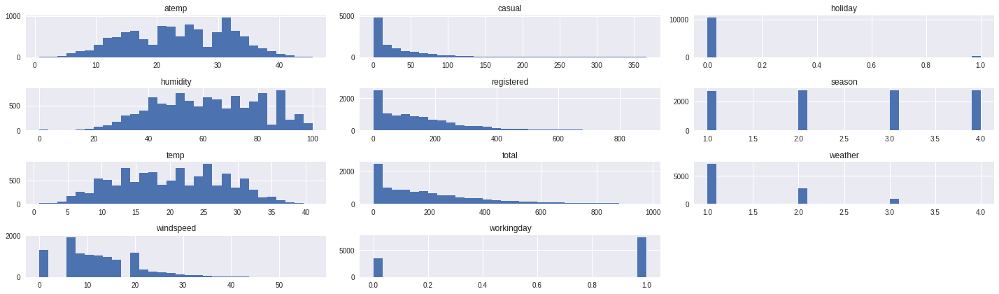

In [189]:
import matplotlib.pyplot as plt
data.hist(bins=30, figsize=(20,6))
plt.tight_layout()
plt.show()

In [0]:
# Cell Configuration for plotly over google colab
# This method pre-populates the outputframe with the configuration that Plotly
# expects and must be executed for every cell which is displaying a Plotly graph.
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [191]:
import numpy as np
import pandas as pd
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=1000,height=400)

# generate a histogram from column median_house_value 
trace = [go.Histogram(x=data["temp"], nbinsx=50)]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

### 2.2.2 Test Set

Para esta analise em especifico o conjunto de dados do **kaggle** já foi fornecido com dois arquivos em separado. Uma para o treinamento (**tran.csv**) e outro para o teste(**test.csv**).

In [196]:
print("the data set has {} atributes, that is the same of {} \
train instances + {} test intances ({})".
      format(len(data)+len(test), len(data), len(test), len(data)+len(test)))


the data set has 17379 atributes, that is the same of 10886 train instances + 6493 test intances (17379)


# 3.0 Visualizar dados para obter Insights


- Foi criada uma cópia da base de dados para treinamento, para explorar os dados sem que sejam feitas modificações no dataset original.

In [0]:
data_train = data.copy()

## 3.1 Visualizar os dados

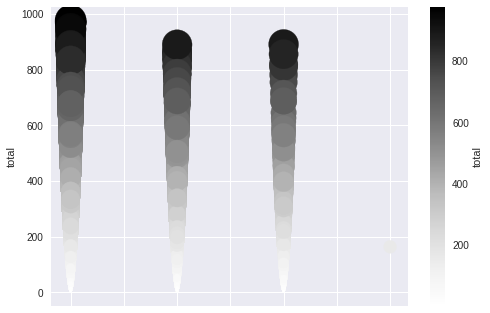

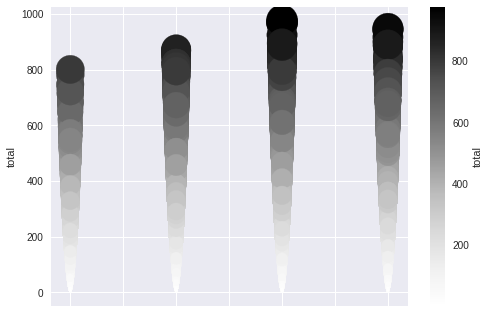

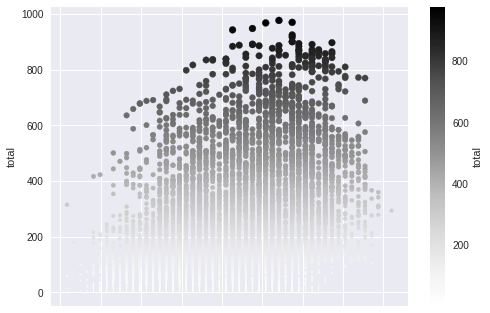

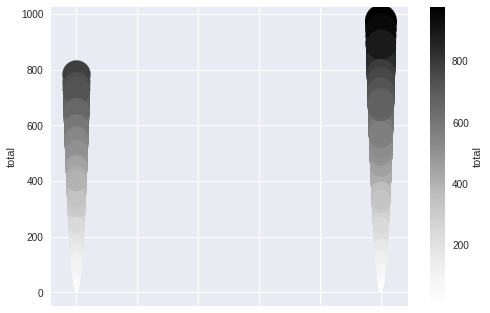

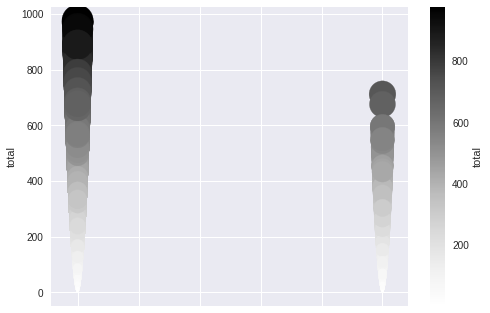

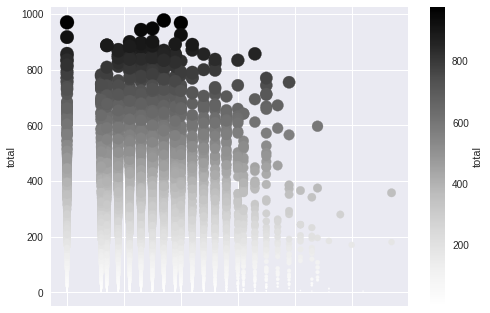

In [200]:

data.plot(kind="scatter", x="weather" , y="total", c="total", s=data["total"])
data.plot(kind="scatter", x="season" , y="total", c="total", s=data["total"])
data.plot(kind="scatter", x="temp" , y="total", c="total", s=data["total"]/20)
data.plot(kind="scatter", x="workingday" , y="total", c="total", s=data["total"])
data.plot(kind="scatter", x="holiday" , y="total", c="total", s=data["total"])
data.plot(kind="scatter", x="windspeed" , y="total", c="total", s=data["total"]/5)

In [0]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=600,height=400)

# generate a scatter from columns latitude and longitude
trace = [go.Scatter(
    x=data["temp"], 
    y=data["total"],
    mode = 'markers',
    marker = dict(
      opacity = 0.6)
)]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

In [160]:
data.plot(kind="scatter", x="weather", y="temp", alpha=0.4,
           s=data["total"], label="total",
           c="total", cmap=plt.get_cmap("jet"), colorbar=True) 
plt.legend()

In [165]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=800,height=600)

# generate a scatter from columns latitude and longitude
trace = [go.Scatter(
    x=data["holiday"], 
    y=data["weather"],
    mode = 'markers',
    marker = dict(
      opacity=0.3,
      size = data["total"]/10,
      color = data["total"],
      colorscale='Jet',
      showscale=True
    ))]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

Ao contrario do que havia pensado em um primeiro momento, há menos alugueis de bicicleta nos dias feriados(1) que nos dias em que não há feriado (0). O que nos leva  a pensar, em um primeiro momento, que a bicicleta vem a ser mais um meio de transporte em whashigton que de lazer. Lembrando que essa é uma interpretação, que pode ser ou não confirmada pela analise que será feita mais adiante. 

## 3.2 Correlação



In [201]:
corr_matrix = data.corr()
corr_matrix["total"].\
  sort_values(ascending=False)

total         1.000000
registered    0.970948
casual        0.690414
temp          0.394454
atemp         0.389784
season        0.163439
windspeed     0.101369
workingday    0.011594
holiday      -0.005393
weather      -0.128655
humidity     -0.317371
Name: total, dtype: float64

The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that there is a strong positive correlation; for example, the median house value tends to go up when the median income goes up. When the coefficient is close to –1, it means that there is a strong negative correlation; you can see a small negative correlation between the latitude and the median house value (i.e., prices have a slight tendency to go down when you go north). Finally, coefficients close to zero mean that there is no linear correlation.

A temperatura e senseção termica foram os atributos que apresentaram uma correlação um pouco maior com o numero total de alugueis (diretamente), enquanto a humidade tem a menos correlação(inversamente). O que pode nos leva a refletir sobre como as condições climaticas atuam na quantidade de bicicletas alugas. Essa dedução também pode ser observada nos graficos apresentados na seção anterior.

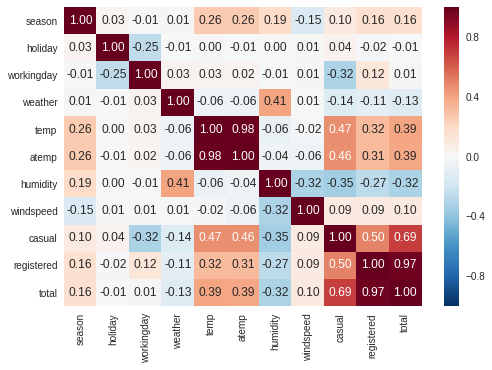

In [202]:
import seaborn as sns
sns.heatmap(data.corr(), 
            annot=True, fmt=".2f")


In [203]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=700,height=400)

# generate a scatter from columns latitude and longitude
trace = [go.Heatmap(
    x=data.corr().index, 
    y=data.corr().index,
    z=data.corr().values,
    colorscale ='Jet')]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

Another way to check for correlation between attributes is to use [Seaborn’ pairplot](https://seaborn.pydata.org/generated/seaborn.pairplot.html) function, which plots every numerical attribute against every other numerical attribute. The main diagonal (top left to bottom right) would be full of straight lines if Seaborn plotted each variable against itself, which would not be very useful. So instead Seaborn displays a histogram of each attribute.

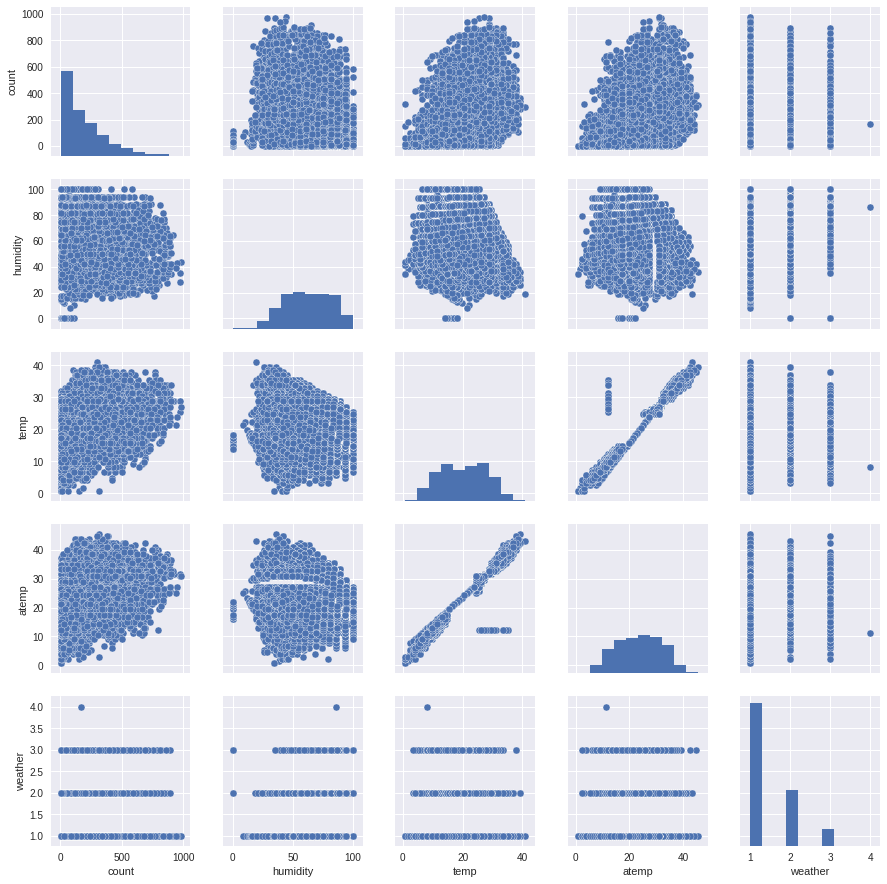

In [169]:
columns = ["total", "humidity", "temp","atemp", "weather"]
sns.pairplot(data[columns], diag_kind='hist')

The most promising attribute to predict the **median house value** is the **median income**, so let’s zoom in on their correlation scatterplot.

In [175]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=1200,height=800,
                  xaxis=dict(title='Temperature'),
                  yaxis=dict(title='Bike total rentals')) 

# generate a scatter from columns latitude and longitude
trace = [go.Scatter(
    y=data["total"], 
    x=data["temp"],
    mode = 'markers')]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

This plot reveals a few things. 
- First, the correlation is indeed very strong; you can clearly see the upward trend and the points are not too dispersed. 
- Second, the price cap that we noticed earlier is clearly visible as a horizontal line at 500,000. 
- But this plot reveals other less obvious straight lines: a horizontal line
around 450,000, another around 350,000, perhaps one around 280,000, and a few more below that. You may want to try removing the corresponding districts to prevent your algorithms from learning to reproduce these data quirks.

In [177]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=600,height=400,
                  xaxis=dict(title='Humidity'),
                  yaxis=dict(title='Total rentals')) 

# generate a scatter from columns latitude and longitude
trace = [go.Scatter(
    y=data["total"], 
    x=data["humidity"],
    mode = 'markers')]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

## 3.3 Experimentando novos atributos

Hopefully the previous sections gave you an idea of a few ways **you can explore the data and gain
insights**. 

- You identified a few data quirks that you may want to **clean up before feeding** the data to a
Machine Learning algorithm, and you found interesting correlations between attributes, in particular with
the target attribute. 
- You also noticed that some attributes have a **tail-heavy distribution**, so you may want
to transform them (e.g., by computing their logarithm). Of course, your mileage will vary considerably
with each project, but the general ideas are similar.
- One last thing you may want to do before actually preparing the data for Machine Learning algorithms is
to try out various attribute combinations. 
  - For example, **the total number of rooms in a district is not very useful** if you don’t know how many households there are. 
  - What you really want is the **number of rooms per household**. 
  - Similarly, the total **number of bedrooms** by itself is not very useful: you probably want to compare it to the number of rooms. 
  - And the **population per household** also seems like an interesting attribute combination to look at. 
  
Let’s create these new attributes:

In [0]:
data_combinations = data

In [0]:

import pandas as pd
hour_date = pd.DataFrame(data["datetime"].str.split(" ").tolist(), columns = ["date","hour"])
#print(hour_date)
data_combinations["hour"] = hour_date["hour"]
data_combinations["date"] = hour_date["date"]

year_month_day= pd.DataFrame(data_combinations["date"].str.split("-").tolist(), columns = ["year","month","day"])
#data_combinations["year"] = pd.to_numeric(year_month_day["year"])
#data_combinations["month"] = pd.to_numeric(year_month_day["month"].str.lstrip("0"))
#data_combinations["day"] = pd.to_numeric(year_month_day["day"].str.lstrip("0"))

data_combinations["year"] = year_month_day["year"].astype(str).astype(int)
data_combinations["month"] = year_month_day["month"].str.lstrip("0").astype(str).astype(int)
data_combinations["day"] = year_month_day["day"].str.lstrip("0").astype(str).astype(int)

In [238]:

data_combinations.info()

#import calendar

#data_combinations.hour.value_counts()
#data_combinations.day.value_counts()
#data_combinations.year.value_counts()
#data_combinations.month.value_counts()

#data_combinations.loc[210:240]


#import calendar
#data_combinations["weekday"] = pd.data_combinations(13).dt.dayofweek
#calendar.weekday(data_combinations["year"],data_combinations["month"],data_combinations["day"])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 17 columns):
datetime      10886 non-null object
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
total         10886 non-null int64
hour          10886 non-null object
date          10886 non-null object
year          10886 non-null int64
month         10886 non-null int64
day           10886 non-null int64
dtypes: float64(3), int64(11), object(3)
memory usage: 1.4+ MB


In [221]:
data_combinations
##data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total,hour,date,year,month,day
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16,00:00:00,2011-01-01,2011,1,1
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40,01:00:00,2011-01-01,2011,1,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32,02:00:00,2011-01-01,2011,1,1
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13,03:00:00,2011-01-01,2011,1,1
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1,04:00:00,2011-01-01,2011,1,1
5,2011-01-01 05:00:00,1,0,0,2,9.84,12.880,75,6.0032,0,1,1,05:00:00,2011-01-01,2011,1,1
6,2011-01-01 06:00:00,1,0,0,1,9.02,13.635,80,0.0000,2,0,2,06:00:00,2011-01-01,2011,1,1
7,2011-01-01 07:00:00,1,0,0,1,8.20,12.880,86,0.0000,1,2,3,07:00:00,2011-01-01,2011,1,1
8,2011-01-01 08:00:00,1,0,0,1,9.84,14.395,75,0.0000,1,7,8,08:00:00,2011-01-01,2011,1,1
9,2011-01-01 09:00:00,1,0,0,1,13.12,17.425,76,0.0000,8,6,14,09:00:00,2011-01-01,2011,1,1


In [233]:
#data["weekend"]
#data.temp.values_count()
data_correlation_matrix = data_combinations.corr()
data_correlation_matrix["total"].sort_values(ascending=False)
#data_combinations.weekend.value_counts()

total         1.000000
registered    0.970948
casual        0.690414
temp          0.394454
atemp         0.389784
year          0.260403
month         0.166862
season        0.163439
windspeed     0.101369
day           0.019826
workingday    0.011594
holiday      -0.005393
weather      -0.128655
humidity     -0.317371
Name: total, dtype: float64

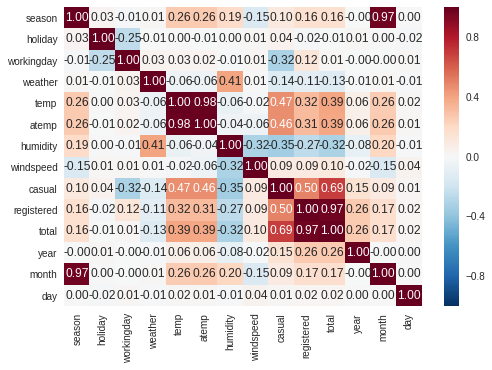

In [234]:
import seaborn as sns
sns.heatmap(data_combinations.corr(), 
            annot=True, fmt=".2f")

*Hey, not bad!*

- The **new bedrooms_per_room** attribute is much more correlated with the median house value than the total number of rooms or bedrooms. 
- Apparently houses with a lower bedroom/room ratio tend to be more expensive.
- The number of rooms per household is also more informative than the total
number of rooms in a district — obviously the larger the houses, the more expensive they are.


This round of exploration does not have to be absolutely thorough; the point is to start off on the right foot and quickly gain insights that will help you get a first reasonably good prototype. But this is an **iterative process**: once you get a prototype up and running, you can analyze its output to gain more insights and come back to this exploration step.

# 4.0 Preparando os dados para os algortmos de Aprendizagem de Máquina


It’s time to **prepare the data** for your Machine Learning algorithms. Instead of just doing this manually, **you should write functions to do that**, for several good reasons:

- This will allow you to **reproduce** these transformations easily on any dataset (e.g., the next time you get a fresh dataset).
-  You will gradually **build a library of transformation functions** that you can **reuse** in future projects.
- This will make it possible for you to **easily try various transformations** and see which combination of transformations works best.


But first let’s revert to a clean training set, and let’s **separate the predictors** and **the labels** since we don’t necessarily want to apply the same transformations to the predictors and the target values.

In [0]:
# just to remind ...
# train_set, test_set = train_test_split(data, test_size=0.2, random_state=35)

# drop creates a copy of the remain data and does not affect train_set
data_combinations_X = data_combinations.drop("total", axis=1)

# copy the label (y) from train_set
data_combinations_y = data_combinations.total.copy()

## 4.1 Limpando os dados

Como o dataset apresentados não tinha, em nenhuma de suas colunas, nenhum valor nulo, esse passo pode ser pulado para esse dataset em especifico.


In [240]:
# count the number of missing values
data_combinations_X.isnull().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
hour          0
date          0
year          0
month         0
day           0
dtype: int64

In [241]:
data_combinations_X
data_combinations_X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 16 columns):
datetime      10886 non-null object
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
hour          10886 non-null object
date          10886 non-null object
year          10886 non-null int64
month         10886 non-null int64
day           10886 non-null int64
dtypes: float64(3), int64(10), object(3)
memory usage: 1.3+ MB


In [242]:
# First, you need to create an Imputer instance, specifying that you want 
# to replace each attribute’s missing values with the median of that attribute:
from sklearn.preprocessing import Imputer
imputer = Imputer(strategy="median")

# Since the median can only be computed on numerical attributes, we need to 
# create a copy of the data without the text attribute ocean_proximity:
data_combinations_X_num = data_combinations_X.drop(["datetime","hour","date"], axis=1)
#data_combinations_X_num = data_combinations_X.drop("date", axis=1)

# Now you can fit the imputer instance to the training data using 
# the fit() method:
imputer.fit(data_combinations_X_num)

Imputer(axis=0, copy=True, missing_values='NaN', strategy='median', verbose=0)

The imputer has simply computed the median of each attribute and stored the result in its **statistics_ instance variable**. 

Only the **total_bedrooms attribute** had missing values, but we cannot be sure that
there won’t be any missing values in new data after the system goes live, so **it is safer to apply the imputer to all the numerical attributes**:

In [243]:
imputer.statistics_

array([3.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 2.0500e+01,
       2.4240e+01, 6.2000e+01, 1.2998e+01, 1.7000e+01, 1.1800e+02,
       2.0120e+03, 7.0000e+00, 1.0000e+01])

In [244]:
data_combinations_X_num.median().values

array([3.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 2.0500e+01,
       2.4240e+01, 6.2000e+01, 1.2998e+01, 1.7000e+01, 1.1800e+02,
       2.0120e+03, 7.0000e+00, 1.0000e+01])

In [0]:
# Now you can use this “trained” imputer to transform the training set by 
# replacing missing values by the learned medians:
data_combinations_X_num_array = imputer.transform(data_combinations_X_num)

# The result is a plain Numpy array containing the transformed features. 
# If you want to put it back into a Pandas DataFrame, it’s simple:
data_combinations_X_num_df = pd.DataFrame(data_combinations_X_num_array, columns=data_combinations_X_num.columns)

In [246]:
data_combinations_X_num_df.isnull().sum()

season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
year          0
month         0
day           0
dtype: int64

## 5.2 Handling Text and Categorical Attributes

Earlier we left out the categorical attribute ocean_proximity because it is a text attribute so we cannot compute its median.

In [247]:
#data_combinations_X.info()
data_combinations_X.hour.head(25)

0     00:00:00
1     01:00:00
2     02:00:00
3     03:00:00
4     04:00:00
5     05:00:00
6     06:00:00
7     07:00:00
8     08:00:00
9     09:00:00
10    10:00:00
11    11:00:00
12    12:00:00
13    13:00:00
14    14:00:00
15    15:00:00
16    16:00:00
17    17:00:00
18    18:00:00
19    19:00:00
20    20:00:00
21    21:00:00
22    22:00:00
23    23:00:00
24    00:00:00
Name: hour, dtype: object

 Most Machine Learning algorithms prefer to work with numbers anyway, so let’s convert these text labels to numbers.

In [248]:
# For this, we can use Pandas' factorize() method which maps each 
# category to a different integer:

data_combinations_X_cat_encoded, data_combinations_X_categories = data_combinations_X.hour.factorize()

# train_X_cat_encoded is now purely numerical
data_combinations_X_cat_encoded[0:100]

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23,  0,  1,  2,  3,  4,  6,  7,  8,  9, 10,
       11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,  0,  1,  4,  5,
        6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
       23,  0,  1,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23,  0,  1,  2,  4,  5,  6,  7,  8])

In [249]:
# factorize() method also return the list of categories
data_combinations_X_categories

Index(['00:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', '05:00:00',
       '06:00:00', '07:00:00', '08:00:00', '09:00:00', '10:00:00', '11:00:00',
       '12:00:00', '13:00:00', '14:00:00', '15:00:00', '16:00:00', '17:00:00',
       '18:00:00', '19:00:00', '20:00:00', '21:00:00', '22:00:00', '23:00:00'],
      dtype='object')

One issue with this representation is that **ML algorithms will assume that two nearby values are more similar than two distant values**. 
- Obviously this is not the case (for example, categories 0 and 4 are more
similar than categories 0 and 2). 
- To fix this issue, a common solution is to **create one binary attribute per
category**: 
  - one attribute equal to 1 when the category is “<1H OCEAN” (and 0 otherwise), another attribute equal to 1 when the category is “INLAND” (and 0 otherwise), and so on. 
  - This is called **one-hot encoding**, because only one attribute will be equal to 1 (hot), while the others will be 0 (cold).

In [250]:
# Scikit-Learn provides a OneHotEncoder encoder to convert 
# integer categorical values into one-hot vectors.

from sklearn.preprocessing import OneHotEncoder 

encoder = OneHotEncoder()

# Numpy's reshape() allows one dimension to be -1, which means "unspecified":
# the value is inferred from the lenght of the array and the remaining
# dimensions
data_combinations_X_cat_1hot = encoder.fit_transform(data_combinations_X_cat_encoded.reshape(-1,1))

# it is a column vector
data_combinations_X_cat_1hot

<10886x24 sparse matrix of type '<class 'numpy.float64'>'
	with 10886 stored elements in Compressed Sparse Row format>

- Note that the **fit_transform()** expects a 2D array, but **train_X_cat_encoded** is a 1D array, so we need to reshape it. 
- Also, notice that the  output is a SciPy sparse matrix, instead of a NumPy array. This is very useful when you have categorical attributes with thousands of categories. If you really want to convert it to a (dense) NumPy array, just call the toarray() method:

In [0]:
data_combinations_X_cat_1hot.toarray()[:20]

In [0]:
import sys

print("Using a sparse matrix: {} bytes".format(sys.getsizeof(train_X_cat_1hot.toarray())))
print("Using a dense numpy array: {} bytes".format(sys.getsizeof(train_X_cat_1hot)))

## 5.3 Custom Transformers

Although Scikit-Learn provides many useful transformers, **you will need to write your own for tasks such as custom cleanup operations or combining specific attributes**. 

You will want your transformer to work seamlessly with Scikit-Learn functionalities. All you need is to create a class and implement three methods: 
- fit()
- transform()
- fit_transform()

You can get the last one for free by simply adding
TransformerMixin as a base class. Also, if you add BaseEstimator as a base class (and avoid *args
and **kargs in your constructor) you will get two extra methods (get_params() and set_params())
that will be useful for automatic hyperparameter tuning. For example, here is a small transformer class
that adds the combined attributes we discussed earlier:

In [0]:
import numpy as np

# these classes will be useful later for automatic hyperparameter tuning 
from sklearn.base import BaseEstimator, TransformerMixin

# indices for the columns
#rooms_ix, bedrooms_ix, population_ix, household_ix = 3, 4, 5, 6
year_ix, month_ix, day_ix = 13, 14, 15 


class CombinedAttributesAdder(BaseEstimator, TransformerMixin):

  def __init__(self, add_weekday2 = True): # no *args or **kargs
    self.add_weekday2 = add_weekday2
    
  def fit(self, X, y=None):
    return self # nothing else to do
  
  def transform(self, X, y=None):
    weekday = calendar.weekday(X[:, year_ix], X[:, month_ix], X[:, day_ix])
    #population_per_household = X[:, population_ix] / X[:, household_ix]
    if self.add_weekday2:
      weekday2 = calendar.weekday(X[:, year_ix], X[:, month_ix], X[:, day_ix])
      # Translates slice objects to concatenation along the second axis.
      return np.c_[X, weekday, 
                   weekday2]
    else:
      return np.c_[X, weekday]

In [0]:
attr_adder = CombinedAttributesAdder(add_weekday2=False)
data_combinations_X_extra_attribs = attr_adder.transform(data_combinations_X.values)

# train_X_extra_attribs is a numpy array
# transforming it to a dataframe for better visualization
data_combinations_X_extra_attribs_df = pd.DataFrame(
    data_combinations_X_extra_attribs,
    columns=list(data_combinations_X.columns)+["weekday"])

data_combinations_X_extra_attribs_df.head()

In [0]:
import numpy as np

# these classes will be useful later for automatic hyperparameter tuning 
from sklearn.base import BaseEstimator, TransformerMixin

# indices for the columns
#date_ix, year_ix, month_ix, day_ix = 12, 13, 14, 15,
month_ix, day_ix = 11, 12


class CombinedAttributesAdder(BaseEstimator, TransformerMixin):

  def __init__(self, add_bedrooms_per_room = True): # no *args or **kargs
    self.add_bedrooms_per_room = add_bedrooms_per_room
    
  def fit(self, X, y=None):
    return self # nothing else to do
  
  def transform(self, X, y=None):
    #rooms_per_household = X[:, day_ix] / X[:, month_ix]
    #population_per_household = X[:, day_ix] / X[:, month_ix]
    if self.add_bedrooms_per_room:
      bedrooms_per_room = X[:, month_ix] / X[:, day_ix]
      # Translates slice objects to concatenation along the second axis.
      return np.c_[X, #rooms_per_household, 
                   #population_per_household, 
                   bedrooms_per_room]
    else:
      return np.c_[X#, rooms_per_household, population_per_household
                  ]
    


In [262]:
  data_combinations_X.info()
  data_combinations_X_extra_attribs_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 16 columns):
datetime      10886 non-null object
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
hour          10886 non-null object
date          10886 non-null object
year          10886 non-null int64
month         10886 non-null int64
day           10886 non-null int64
dtypes: float64(3), int64(10), object(3)
memory usage: 1.3+ MB


,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,hour,date,year,month,day
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0,3,13,00:00:00,2011-01-01,2011,1,1
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0,8,32,01:00:00,2011-01-01,2011,1,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0,5,27,02:00:00,2011-01-01,2011,1,1
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0,3,10,03:00:00,2011-01-01,2011,1,1
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0,0,1,04:00:00,2011-01-01,2011,1,1


In [263]:
attr_adder = CombinedAttributesAdder(add_bedrooms_per_room=False)
data_combinations_X_extra_attribs = attr_adder.transform(data_combinations_X.values)

# train_X_extra_attribs is a numpy array
# transforming it to a dataframe for better visualization
data_combinations_X_extra_attribs_df = pd.DataFrame(
    data_combinations_X_extra_attribs,
    columns=list(data_combinations_X.columns)#+["rooms_per_household", 
                                   #"population_per_household"]
                          )

data_combinations_X_extra_attribs_df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,hour,date,year,month,day
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0,3,13,00:00:00,2011-01-01,2011,1,1
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0,8,32,01:00:00,2011-01-01,2011,1,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0,5,27,02:00:00,2011-01-01,2011,1,1
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0,3,10,03:00:00,2011-01-01,2011,1,1
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0,0,1,04:00:00,2011-01-01,2011,1,1


**In this example the transformer has one hyperparameter, add_bedrooms_per_room**, set to True by default (it is often helpful to provide sensible defaults). 

This hyperparameter will allow you to easily find out whether adding this attribute helps the Machine Learning algorithms or not. 

More generally, you can add a hyperparameter to gate any data preparation step that you are not 100% sure about. The more you automate these data preparation steps, the more combinations you can automatically try out, making it much more likely that you will find a great combination (and saving you a lot of time).



## 5.5 Feature Scaling

One of the most important transformations you need to apply to your data is feature scaling. With few exceptions, **Machine Learning algorithms don’t perform well when the input numerical attributes have
very different scales**. 

This is the case for the housing data: 
- the total number of rooms ranges from about 6 to 39,320
- the median incomes only range from 0 to 15. 

**Note that scaling the target values is generally not required.**

There are two common ways to get all attributes to have the same scale: 
- min-max scaling
- standardization.


Min-max scaling (many people call this normalization) is quite simple: values are shifted and rescaled so that they end up ranging from 0 to 1. We do this by subtracting the min value and dividing by the max minus the min. Scikit-Learn provides a transformer called **MinMaxScaler** for this. It has a **feature_range hyperparameter** that lets you change the range if you don’t want 0–1 for some reason.


Standardization is quite different: first it subtracts the mean value (so standardized values always have a zero mean), and then it divides by the variance so that the resulting distribution has unit variance. Unlike min-max scaling, standardization does not bound values to a specific range, which may be a problem for some algorithms (e.g., neural networks often expect an input value ranging from 0 to 1). However,
standardization is much less affected by outliers. For example, suppose a district had a median income equal to 100 (by mistake). Min-max scaling would then crush all the other values from 0–15 down to 0–0.15, whereas standardization would not be much affected. Scikit-Learn provides a transformer called **StandardScaler** for standardization.

## 5.6 Transformation Pipelines

As you can see, there are many data transformation steps that need to be executed in the right order. Fortunately, Scikit-Learn provides the [Pipeline class](http://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) to help with such sequences of transformations. Here is a small pipeline for the numerical attributes:

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


num_pipeline = Pipeline([('imputer', Imputer(strategy="median")),
                         ('attribs_adder', CombinedAttributesAdder()),
                         ('std_scaler', StandardScaler())
                        ])
data_combinations_X_num_pipeline = num_pipeline.fit_transform(data_combinations_X_num)

In [270]:
data_combinations_X_num_pipeline

array([[-1.34986372, -0.17149048, -1.46067232, ..., -1.60312148,
        -1.64206967, -0.12440079],
       [-1.34986372, -0.17149048, -1.46067232, ..., -1.60312148,
        -1.64206967, -0.12440079],
       [-1.34986372, -0.17149048, -1.46067232, ..., -1.60312148,
        -1.64206967, -0.12440079],
       ...,
       [ 1.33801198, -0.17149048,  0.68461625, ...,  1.59063939,
         1.64478707, -0.334277  ],
       [ 1.33801198, -0.17149048,  0.68461625, ...,  1.59063939,
         1.64478707, -0.334277  ],
       [ 1.33801198, -0.17149048,  0.68461625, ...,  1.59063939,
         1.64478707, -0.334277  ]])

Now it would be nice if we could feed a Pandas DataFrame containing non-numerical columns directly into your pipeline, instead of having to first manually extract the numerical columns into a NumPy array. **There is nothing in Scikit-Learn to handle Pandas DataFrames, but we can write a custom transformer for this task**:

In [0]:
from sklearn.base import BaseEstimator, TransformerMixin

# This class will transform the data by selecting the desired attributes,
# dropping the rest, and converting the resulting DataFrame to a NumPy array.
class DataFrameSelector(BaseEstimator, TransformerMixin):
  def __init__(self, attribute_names):
    self.attribute_names = attribute_names

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    return X[self.attribute_names].values

With this class:
- you can easily write a pipeline that will take a Pandas DataFrame and handle only the numerical values
- and you can just as easily write another pipeline for the categorical attributes.

In [0]:
# Used to join two or more pipelines into a single pipeline
from sklearn.pipeline import FeatureUnion

# https://github.com/scikit-learn/scikit-learn/issues/10521
#from future_encoders import OneHotEncoder

# numerical columns 
num_attribs = list(data_combinations_X_num.columns)

# categorical columns
cat_attribs = ["datetime","hour","date"]

# pipeline for numerical columns
num_pipeline = Pipeline([('selector', DataFrameSelector(num_attribs)),
                         ('imputer', Imputer(strategy="median")),
                         ('attribs_adder', CombinedAttributesAdder()),
                         ('std_scaler', StandardScaler())
                        ])

# pipeline for categorical column
cat_pipeline = Pipeline([('selector', DataFrameSelector(cat_attribs)),
                         ('cat_encoder', OneHotEncoder(sparse=False))
                        ])

# a full pipeline handling both numerical and categorical attributes
full_pipeline = FeatureUnion(transformer_list=[("num_pipeline", num_pipeline),
                                               ("cat_pipeline", cat_pipeline)
                                              ])

In [0]:
# you can run the whole pipeline simply
data_combinations_X_prepared = full_pipeline.fit_transform(data_combinations_X)
data_combinations_X_prepared

In [274]:
data_combinations_X_prepared.shape
#data_combinations_X_num_pipeline

(10886, 16)

# 6.0 Select and Train a Model

At last!!! 

- You framed the problem
- You got the data and explored it
- You sample a training set and a test set
- You wrote transformation pipelines to clean up and prepare your data
- **You are now ready to select and train a Machine Learning model**

## 6.1 Training and Evaluating on the Training Set

The good news is that thanks to all these previous steps, things are now going to be much simpler than you might think. **Let's first train a Linear Regression model.**

In [0]:
from sklearn.linear_model import LinearRegression

# create a LinearRegression model
lin_reg = LinearRegression()

# fit it
lin_reg.fit(data_combinations_X_prepared, data_combinations_y)

In [0]:
data_combinations_X_prepared.info()

In [0]:
# Done!! You now have a working Linear Regression Model.
# Let's try it out on a few instances from the trainning set.

# prepare the data
some_data = data_combinations_X_num_pipeline.iloc[:5]
some_labels = data_combinations_y.iloc[:5]
some_data_prepared = full_pipeline.transform(some_data)

# make predictions
print("Predictions:", lin_reg.predict(some_data_prepared)) 

In [0]:
# Compare against the actual values:
print("Labels:", list(some_labels))

It works, although the predictions are not exactly accurate. Let's measure this regression model's RMSE on the whole training set using Scikit-Learn's **mean_squared_error** function.



In [0]:
from sklearn.metrics import mean_squared_error

housing_predictions = lin_reg.predict(train_X_prepared)
lin_mse = mean_squared_error(train_y, housing_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

Okay, this is better than nothing but clearly not a great score: most districts' **median_housing_values** range between 119,000 and 264,000 (look the boxplot below), so a typical prediction error of 68,089 is not very satisfying. 

This is an example of a model underfiting the training data. When this happens it can mean that the features do not provide enough information to make good predictions, or that the model is not powerful enough. The main ways to fix underfitting are:
- select a more powerful model
- to feed the training algorithm with better features
- to reduce the constraints on the model

You could try to add more features (e.g the log of the population), but first let's try a more complex model to see how it does. 

In [0]:
import numpy as np
import pandas as pd
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=500,height=400)

# generate a histogram from column median_house_value 
housing_values = [go.Box(y=train_y,
                        name='Housing values',
                        boxmean=True)]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=housing_values,layout=layout)
pyo.iplot(fig)

Let's train a DecisionTreeRegressor. This is a powerful model, capable of finding complex nonlinear relationships in the data. 

In [0]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(train_X_prepared, train_y)

In [0]:
# now that the model is trained, let's evaluate it on the training set

housing_predictions = tree_reg.predict(some_data_prepared)
tree_mse = mean_squared_error(some_labels, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

Wait, whattttttttttttttt?

No error at all?

Could this model really be absolutely perfect?

Of course, it is much more likely the model has badly overfit the data. How can you be sure?  As we saw earlier, you don't want to touch the test set until you are ready to launch a model you are confident about, so you need to use part of the training set for training, and part for model validation. 


## 6.2 Better Evaluation Using Cross-Validation

One way to evaluate the Decision Tree model would be to use the [train_test_split](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) function:
- to **split the training set** into a **smaller training set** and a **validation set**
- then **train** your models against the **smaller training set** 
- and **evaluate** them against the **validation set**. 


It’s a bit of work, but nothing too difficult and it
would work fairly well.


A great alternative is to use [Scikit-Learn’s cross-validation](http://scikit-learn.org/stable/modules/cross_validation.html) feature. 

The following code performs K-fold cross-validation:
- it randomly splits the training set into 10 distinct subsets called folds
- then it trains and evaluates the Decision Tree model 10 times
- picking a different fold for evaluation every time and training on the other 9 folds.
- the result is an array containing the 10 evaluation scores

In [0]:
from sklearn.model_selection import cross_val_score


tree_reg = DecisionTreeRegressor()

scores = cross_val_score(tree_reg, 
                         train_X_prepared, 
                         train_y,
                         scoring="neg_mean_squared_error",
                         cv=10)
rmse_scores = np.sqrt(-scores)
rmse_scores

# Scikit-Learn cross-validation features expect a utility function (greater is better)
# rather than a cost function (lower is better), so the scoring function is 
# actually the opposite of the MSE (i.e., a negative value), which is why the 
# preceding code computes scores before calculating the square root.

array([72736.1797298 , 72006.97527284, 73576.41678074, 71039.94583568,
       67490.52757671, 64832.59004036, 71456.69175816, 68473.85122388,
       68656.14282489, 69297.33951952])

In [0]:
def display_scores(scores):
  print("Scores:", scores)
  print("Mean:", scores.mean())
  print("Standard deviation:", scores.std())

In [0]:
display_scores(rmse_scores)

Scores: [72736.1797298  72006.97527284 73576.41678074 71039.94583568
 67490.52757671 64832.59004036 71456.69175816 68473.85122388
 68656.14282489 69297.33951952]
Mean: 69956.66605625764
Standard deviation: 2551.831452913527


Now the **Decision Tree doesn’t look as good as it did earlier**. 

In fact, it seems to perform worse than the Linear Regression model! Notice that cross-validation allows you to get not only an estimate of the performance of your model, but also a measure of how precise this estimate is (i.e., its standard
deviation). 

The Decision Tree has a score of approximately 70,000, generally ±2600. You would not have this information if you just used one validation set. But cross-validation comes at the cost of training the model several times, so it is not always possible.



Let’s compute the same scores for the Linear Regression model just to be sure:


In [0]:
lin_reg = LinearRegression()

lin_scores = cross_val_score(lin_reg, 
                             train_X_prepared, 
                             train_y,
                             scoring="neg_mean_squared_error", 
                             cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [70715.10105097 67073.39881848 70838.04099604 67554.17889268
 66899.49055729 65194.36521007 70433.39627599 71899.00507697
 65779.96671776 67532.51453746]
Mean: 68391.94581337104
Standard deviation: 2242.784819848661


That’s right: **the Decision Tree model is overfitting so badly that it performs worse than the Linear Regression model**.



Let’s try one last model now: the **RandomForestRegressor**. 

Random Forests works by training many Decision Trees on random subsets of the features, then averaging out their predictions. 

Building a model on top of many other models is called **Ensemble Learning**, and it is often a great way to push ML algorithms even further. 

In [0]:
from sklearn.ensemble import RandomForestRegressor

# create a RandomForestRegressor model
forest_reg = RandomForestRegressor()

# fit it
forest_reg.fit(train_X_prepared, train_y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [0]:
# predict the prepared data
housing_predictions = forest_reg.predict(train_X_prepared)

forest_mse = mean_squared_error(train_y, housing_predictions)
forest_rmse = np.sqrt(forest_mse)
forest_rmse

22240.182501670937

In [0]:
from sklearn.model_selection import cross_val_score

forest_reg = RandomForestRegressor()

forest_scores = cross_val_score(forest_reg,
                                train_X_prepared, 
                                train_y,
                                scoring="neg_mean_squared_error", 
                                cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

Scores: [50496.59913084 52342.26757339 55791.39575887 53356.58639493
 51194.69944542 50785.042719   51892.90293688 53495.23841149
 50953.59595719 51025.0930606 ]
Mean: 52133.342138861495
Standard deviation: 1575.8112602663678


Wow, this is much better: Random Forests look very promising. However, note:
- the score on the training set is still much lower than on the validation sets
- meaning that the model is still overfitting the training set. 

Possible solutions for overfitting are:
- to simplify the model
- constrain it (i.e., regularize it)
- or get a lot more training data. 

However, before you dive much deeper in Random Forests, you should try out
many other models from various categories of Machine Learning algorithms (several Support Vector Machines with different kernels, possibly a neural network, etc.), without spending too much time tweaking the hyperparameters. The goal is to shortlist a few (two to five) promising models.

# 7.0 Fine-Tune Your Model

Let’s assume that you now have a shortlist of promising models. **You now need to fine-tune them**. Let’s
look at a few ways you can do that.




## 7.1 Grid Search

One way to do that would be to fiddle with the **hyperparameters manually**, until you find a great
combination of hyperparameter values. This would be **very tedious work**, and you may not have time to
explore many combinations.


Instead you should get [Scikit-Learn’s GridSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) to search for you. 

All you need to do is tell it which hyperparameters you want it to experiment with, and what values to try out, and it will evaluate all the possible combinations of hyperparameter values, using cross-validation. For example, the following code searches for the best combination of hyperparameter values for the RandomForestRegressor:

In [0]:
from sklearn.model_selection import GridSearchCV

# hyperparameters values
# param_grid[0] - 12 combinations
# param_grid[1] - 6 combinations
param_grid = [{'n_estimators': [3, 10, 30], 
               'max_features': [2, 4, 6, 8]
              },
              {'bootstrap': [False], 
               'n_estimators': [3, 10],
               'max_features': [2, 3, 4]
              }
             ]

# create a randomforeestregressor model
forest_reg = RandomForestRegressor()

# run the grid search with cross validation
# (12 + 6) x 5 = 90 combinations
grid_search = GridSearchCV(forest_reg, 
                           param_grid, 
                           cv=5,
                           scoring='neg_mean_squared_error')

# see 90 combinations!!!
# it may take quite a long time
grid_search.fit(train_X_prepared, train_y)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]}, {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

In [0]:
# when gridsearch is done you can get the best combination of parameters
grid_search.best_params_

{'max_features': 6, 'n_estimators': 30}

In [0]:
# you can also get the best estimator too
grid_search.best_estimator_

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=6, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=30, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [0]:
# and of course, the evaluation scores are also available
cvres = grid_search.cv_results_
cvres

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('mean_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split2_train_score'), which will not be available by default any m

{'mean_fit_time': array([0.06990924, 0.22783661, 0.679321  , 0.1135376 , 0.36998429,
        1.12016249, 0.16098137, 0.52387199, 1.57770209, 0.20383973,
        0.67902722, 2.04019022, 0.1095089 , 0.36076398, 0.14693546,
        0.48151217, 0.1875927 , 0.6452538 ]),
 'mean_score_time': array([0.00473495, 0.01329246, 0.03714228, 0.00456848, 0.01360106,
        0.03643904, 0.00445089, 0.01278963, 0.03663311, 0.00465937,
        0.01286244, 0.03648996, 0.00555277, 0.01605444, 0.00557528,
        0.015873  , 0.00555449, 0.01651444]),
 'mean_test_score': array([-4.15999117e+09, -3.08660908e+09, -2.71135124e+09, -3.54694142e+09,
        -2.73592690e+09, -2.50205962e+09, -3.41352653e+09, -2.69471273e+09,
        -2.45370503e+09, -3.43034369e+09, -2.64185779e+09, -2.48104781e+09,
        -3.77535020e+09, -2.95470876e+09, -3.57128008e+09, -2.73806742e+09,
        -3.45497215e+09, -2.61710884e+09]),
 'mean_train_score': array([-1.13523569e+09, -5.66574341e+08, -4.23877053e+08, -9.58726689e+08,
 

In [0]:
# a fancy visualization of results
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
  print(np.sqrt(-mean_score), params)

64497.993547298574 {'max_features': 2, 'n_estimators': 3}
55557.25946013379 {'max_features': 2, 'n_estimators': 10}
52070.63702205001 {'max_features': 2, 'n_estimators': 30}
59556.203848164994 {'max_features': 4, 'n_estimators': 3}
52306.08858772325 {'max_features': 4, 'n_estimators': 10}
50020.59198917925 {'max_features': 4, 'n_estimators': 30}
58425.392826089344 {'max_features': 6, 'n_estimators': 3}
51910.62249827634 {'max_features': 6, 'n_estimators': 10}
49534.88695811002 {'max_features': 6, 'n_estimators': 30}
58569.136011037335 {'max_features': 8, 'n_estimators': 3}
51399.005741454974 {'max_features': 8, 'n_estimators': 10}
49810.117569768365 {'max_features': 8, 'n_estimators': 30}
61443.87843825742 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
54357.23278620092 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
59760.18806219216 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
52326.546042413844 {'bootstrap': False, 'max_features': 3, 'n_estimato

In this example, we obtain the best solution by setting:
- the **max_features** hyperparameter to **6**
- and the **n_estimators** hyperparameter to **30**. 

The RMSE score for this combination is 49,481, which is slightly better than the score you got earlier using the default hyperparameter values (which was 51,969).

**Congratulations, you have successfully fine-tuned your best model!**

## 7.2 Randomized Search

The grid search approach is fine when you are exploring relatively few combinations, like in the previous example, but when the hyperparameter search space is large, it is often preferable to use [RandomizedSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html) instead. 
 - it evaluates a given number of random combinations by selecting a random value for each hyperparameter at every iteration.
 
This approach has two main benefits:
- If you let the randomized search run for, say, 1,000 iterations, this approach will explore 1,000 different values for each hyperparameter (instead of just a few values per hyperparameter with the grid search approach).
- You have more control over the computing budget you want to allocate to hyperparameter search, simply by setting the number of iterations.

## 7.3 Ensemble Methods

Another way to fine-tune your system is to try to combine the models that perform best. The group (or “ensemble”) will often perform better than the best individual model (just like Random Forests perform better than the individual Decision Trees they rely on), especially if the individual models make very different types of errors.



## 7.4 Analyze the Best Models and Their Errors

In [0]:
# can indicate the relative importance of each attribute 
# for making accurate predictions
feature_importances = grid_search.best_estimator_.feature_importances_
feature_importances

array([7.87423698e-02, 7.19964448e-02, 4.39549116e-02, 1.80998285e-02,
       1.63632793e-02, 1.75549786e-02, 1.56041456e-02, 3.53989544e-01,
       5.70186035e-02, 1.06522529e-01, 6.33311057e-02, 1.41611057e-02,
       1.34340593e-01, 2.45108587e-04, 3.22312113e-03, 4.85233110e-03])

In [0]:
# let's display these importance scores next to their corresponding attribute names

# extra numerical columns
extra_attribs = ["rooms_per_hhold", "pop_per_hhold", "bedrooms_per_room"]

# categorical component of pipeline
cat_encoder = cat_pipeline.named_steps["cat_encoder"]

# get the names
cat_one_hot_attribs = list(cat_encoder.categories_[0])

# all columns names
attributes = num_attribs + extra_attribs + cat_one_hot_attribs

In [0]:
sorted(zip(feature_importances, attributes), reverse=True)

[(0.353989543798363, 'median_income'),
 (0.13434059314021846, 'INLAND'),
 (0.10652252919674918, 'pop_per_hhold'),
 (0.07874236980919312, 'longitude'),
 (0.07199644484303452, 'latitude'),
 (0.06333110574623965, 'bedrooms_per_room'),
 (0.05701860350035514, 'rooms_per_hhold'),
 (0.043954911556316076, 'housing_median_age'),
 (0.018099828470609505, 'total_rooms'),
 (0.017554978589238487, 'population'),
 (0.016363279301931325, 'total_bedrooms'),
 (0.01560414556486487, 'households'),
 (0.014161105670307693, '<1H OCEAN'),
 (0.004852331099045453, 'NEAR OCEAN'),
 (0.0032231211269021605, 'NEAR BAY'),
 (0.00024510858663137055, 'ISLAND')]

With this information, you may want to try dropping some of the less useful features (e.g., **apparently only one ocean_proximity category is really useful**, so you could try dropping the others).

# 9.0 Present your solution


After tweaking your models for a while, you eventually have a system that performs sufficiently well. **Now is the time to evaluate the final model on the test set**.

There is nothing special about this process:
- just get the **predictors** and the **labels** from your **test set**, 
- **run your full_pipeline** to transform the data (**call transform(), not fit_transform()!**)
- and **evaluate** the final model on the test set

In [0]:
# best model found in gridsearch step
final_model = grid_search.best_estimator_

# predictors and label
test_X = test_set.drop("median_house_value", axis=1)
test_y = test_set["median_house_value"].copy()

# prepared test's predictors
test_X_prepared = full_pipeline.transform(test_X)


final_predictions = final_model.predict(test_X_prepared)
final_mse = mean_squared_error(test_y, final_predictions)
final_rmse = np.sqrt(final_mse)
print(final_rmse)

50027.076978996345


The performance will usually be slightly worse than what you measured using cross-validation if you did a lot of hyperparameter tuning (because your system ends up fine-tuned to perform well on the validation data, and will likely not perform as well on unknown datasets).

It is not the case in this example, but when this happens you must resist the temptation to tweak the hyperparameters to make the numbers look good
on the test set; the improvements would be unlikely to generalize to new data.

Now comes the project prelaunch phase: 
- you need to present your solution
- highlighting what you have learned
- what worked and what did not
- what assumptions were made
- and what your system’s limitations are
- document everything
- and create nice presentations with clear visualizations and easy-to-remember
statements (e.g., “the median income is the number one predictor of housing prices”).